<a href="https://colab.research.google.com/github/fadouaamri/Human_face_generator/blob/main/FaceGenerator.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#◘acces to drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install patool

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.5/77.5 kB 1.6 MB/s eta 0:00:00


In [ ]:
import patoolib
patoolib.extract_archive("/content/drive/MyDrive/test/img_align_celeba.rar", outdir="/content/drive/MyDrive/test/")


In [ ]:
import os
import glob
import numpy as np
from PIL import Image

DATA_DIR = "/content/drive/MyDrive/test/img_align_celeba/img_align_celeba/"
path_celeb = []
#create list of path images
for path in os.listdir(DATA_DIR):
    if '.jpg' in path:
        path_celeb.append(os.path.join(DATA_DIR, path))


In [ ]:
len(path_celeb)


23883

In [ ]:

new_path=path_celeb[:20000]

In [ ]:
#convert images into numpy array and resize them into (64,64,3)
crop = (30, 55, 150, 175)
images = [np.array((Image.open(path).crop(crop)).resize((64,64))) for path in new_path]

for i in range(len(images)):
  #standardization
    images[i] = ((images[i] - images[i].min())/(255 - images[i].min()))


images = np.array(images)


In [ ]:
#display the number of images and their shape
print(images.shape)

(20000, 64, 64, 3)


In [ ]:
train_data=images

In [ ]:

import matplotlib.pyplot as plt
from keras import preprocessing
from keras.models import Sequential,Model
from keras.layers import Conv2D,Dropout,Dense,Flatten,Conv2DTranspose,BatchNormalization,LeakyReLU,Reshape
from keras import Input
from keras.optimizers import RMSprop

import tensorflow as tf

<Figure size 1000x1000 with 0 Axes>

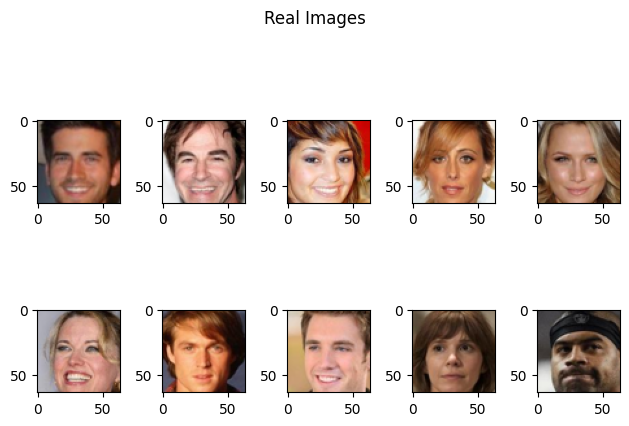

In [ ]:
#data visualization
plt.figure(figsize=(10,10))
fig,ax=plt.subplots(2,5)
fig.suptitle("Real Images")
index=100

for i in range(2):
    for j in range(5):
            ax[i,j].imshow(train_data[index].reshape(64,64,3))


            index+=150

plt.tight_layout()
plt.show()

In [ ]:
##############################Model#######################################

In [ ]:
######################Generator
noise_shape = 100
generator=Sequential()
generator.add(Dense(4*4*512,input_shape=[noise_shape]))
generator.add(Reshape([4,4,512]))
generator.add(Conv2DTranspose(256, kernel_size=4, strides=2, padding="same"))
generator.add(LeakyReLU(alpha=0.2))
generator.add(BatchNormalization())
generator.add(Conv2DTranspose(128, kernel_size=4, strides=2, padding="same"))
generator.add(LeakyReLU(alpha=0.2))
generator.add(BatchNormalization())
generator.add(Conv2DTranspose(64, kernel_size=4, strides=2, padding="same"))
generator.add(LeakyReLU(alpha=0.2))
generator.add(BatchNormalization())
generator.add(Conv2DTranspose(3, kernel_size=4, strides=2, padding="same",activation='sigmoid'))

In [ ]:
generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 8192)              827392    
                                                                 
 reshape (Reshape)           (None, 4, 4, 512)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 8, 8, 256)        2097408   
 nspose)                                                         
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 8, 8, 256)         0         
                                                                 
 batch_normalization (BatchN  (None, 8, 8, 256)        1024      
 ormalization)                                                   
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 16, 16, 128)      5

In [ ]:
####################Discriminator
discriminator=Sequential()
discriminator.add(Conv2D(32, kernel_size=4, strides=2, padding="same",input_shape=[64,64, 3]))
discriminator.add(Conv2D(64, kernel_size=4, strides=2, padding="same"))
discriminator.add(LeakyReLU(0.2))
discriminator.add(BatchNormalization())
discriminator.add(Conv2D(128, kernel_size=4, strides=2, padding="same"))
discriminator.add(LeakyReLU(0.2))
discriminator.add(BatchNormalization())
discriminator.add(Conv2D(256, kernel_size=4, strides=2, padding="same"))
discriminator.add(LeakyReLU(0.2))
discriminator.add(Flatten())
discriminator.add(Dropout(0.5))
discriminator.add(Dense(1,activation='sigmoid'))

In [ ]:
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 32)        1568      
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 64)        32832     
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 16, 16, 64)        0         
                                                                 
 batch_normalization_3 (Batc  (None, 16, 16, 64)       256       
 hNormalization)                                                 
                                                                 
 conv2d_2 (Conv2D)           (None, 8, 8, 128)         131200    
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 8, 8, 128)         0         
                                                      

In [ ]:
#combined model
GAN =Sequential([generator,discriminator])
#use adam and binary_crossentropy for both neural networks
discriminator.compile(optimizer='adam',loss='binary_crossentropy')
discriminator.trainable = False
GAN.compile(optimizer='adam',loss='binary_crossentropy')

Currently on Epoch 1
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 265ms/step


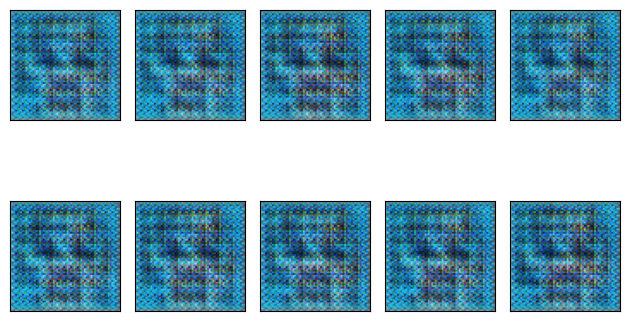

Epoch: 1,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 2
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 2,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 3
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 3,  Loss: D_real = 0.0001, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 4
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 4,  Loss: D_real = 10.2310, D_fake = 0.0016,  G = 0.0000
Currently on Epoch 5
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 5,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0884
Currently on Epoch 6
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 20ms/step


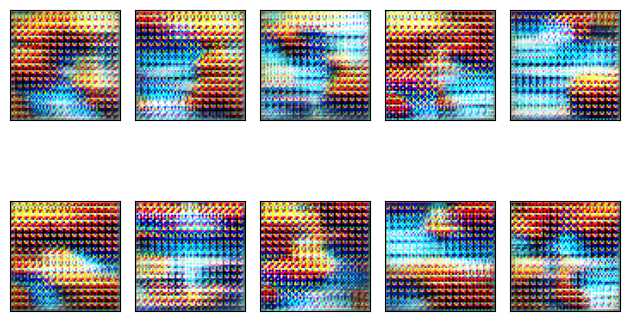

Epoch: 6,  Loss: D_real = 0.0089, D_fake = 0.0000,  G = 0.0067
Currently on Epoch 7
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 7,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0021
Currently on Epoch 8
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 8,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0002
Currently on Epoch 9
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 9,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0006
Currently on Epoch 10
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 10,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 11
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 19ms/step


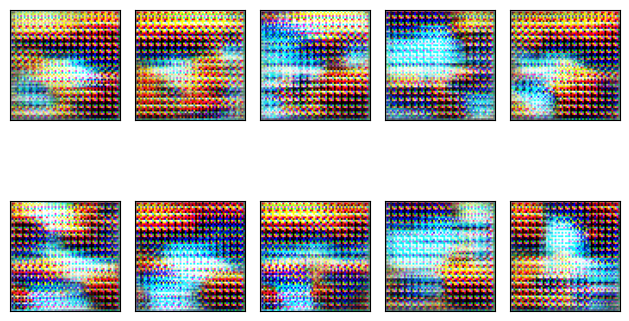

Epoch: 11,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 12
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 12,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0001
Currently on Epoch 13
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 13,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0001
Currently on Epoch 14
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 14,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0003
Currently on Epoch 15
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 15,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0001
Currently on Epoch 16
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 42ms/step


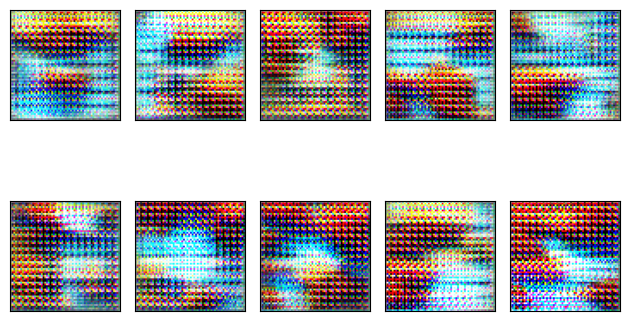

Epoch: 16,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0001
Currently on Epoch 17
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 17,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0001
Currently on Epoch 18
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 18,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 19
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 19,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0974
Currently on Epoch 20
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 20,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 21
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 18ms/step


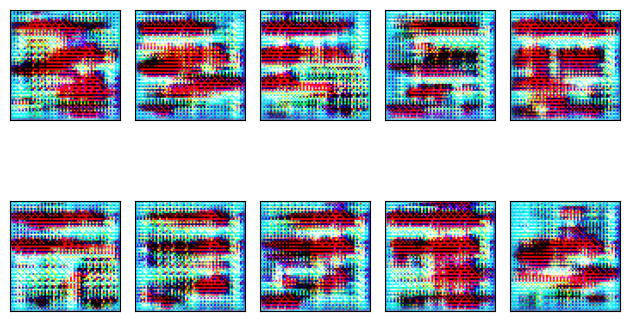

Epoch: 21,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 22
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 22,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0039
Currently on Epoch 23
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 23,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 6.9945
Currently on Epoch 24
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 24,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0020
Currently on Epoch 25
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 25,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 26
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 19ms/step


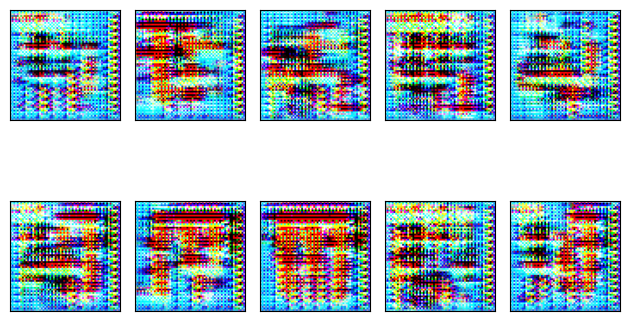

Epoch: 26,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 27
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 27,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 28
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 28,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 29
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 29,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 30
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 30,  Loss: D_real = 0.0000, D_fake = 0.1345,  G = 0.1141
Currently on Epoch 31
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 18ms/step


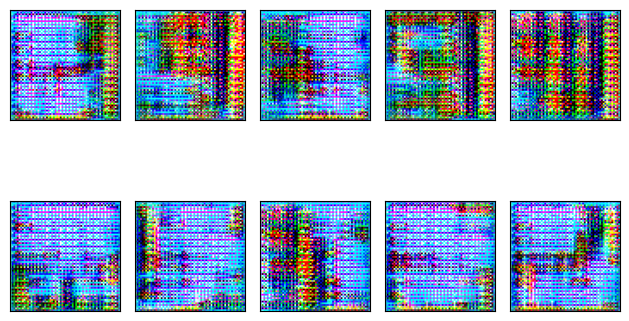

Epoch: 31,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 32
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 32,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 33
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 33,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 34
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 34,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 35
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 35,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 36
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 24ms/step


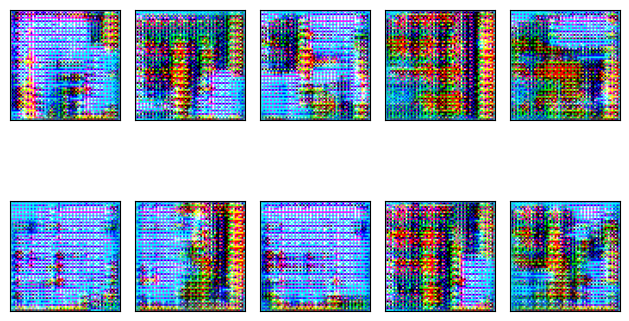

Epoch: 36,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 37
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 37,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 38
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 38,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 39
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 39,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 40
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 40,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 41
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 20ms/step


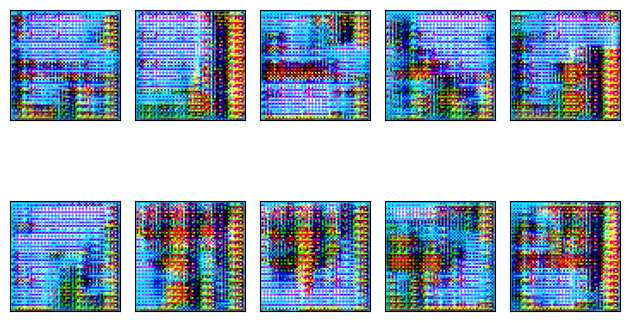

Epoch: 41,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 42
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 42,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 43
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 43,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 44
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 44,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 45
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 45,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 46
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 18ms/step


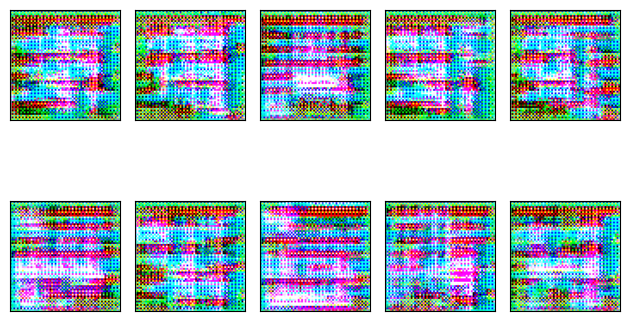

Epoch: 46,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 34.2517
Currently on Epoch 47
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 47,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 48
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 48,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 49
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 49,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 50
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 50,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 51
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 19ms/step


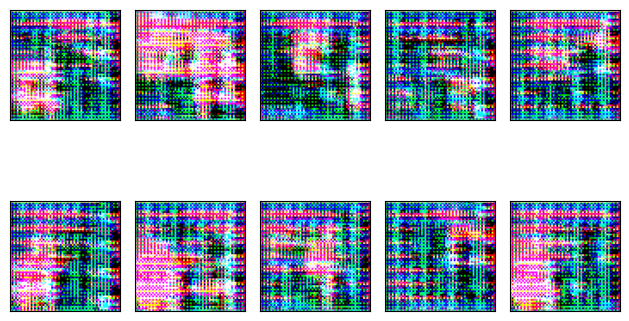

Epoch: 51,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 52
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 52,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 53
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 53,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 54
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 54,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 55
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 55,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 56
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 18ms/step


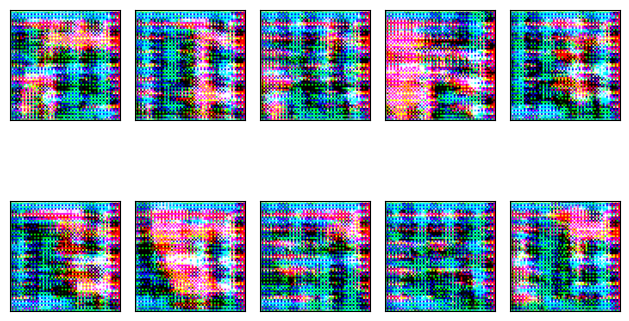

Epoch: 56,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 57
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 57,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 58
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 58,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 59
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 59,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 60
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 60,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 61
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 19ms/step


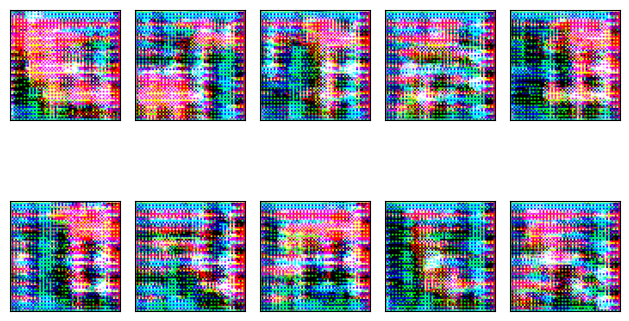

Epoch: 61,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 62
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 62,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 63
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 63,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 64
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 64,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 65
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 65,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 66
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 19ms/step


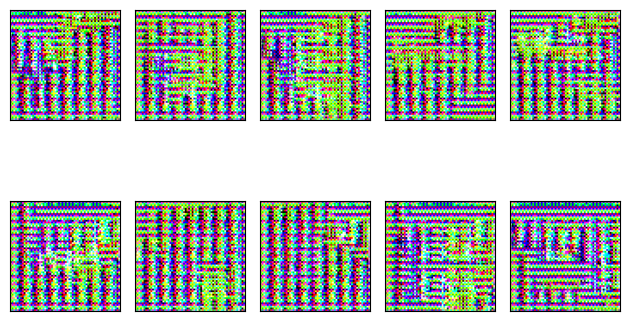

Epoch: 66,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 67
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 67,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 68
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 68,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 69
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 69,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 70
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 70,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 71
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 20ms/step


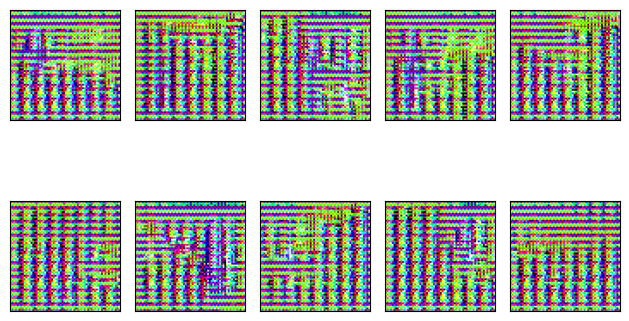

Epoch: 71,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 72
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 72,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 73
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 73,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 74
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 74,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 75
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 75,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 76
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 19ms/step


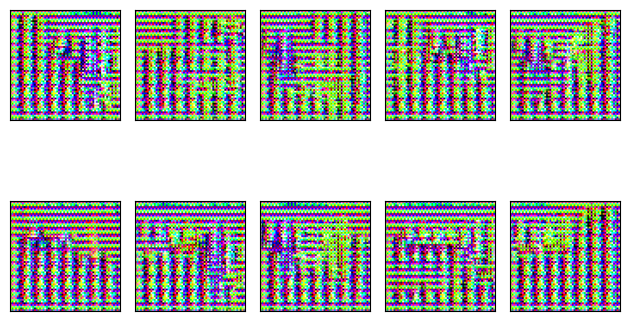

Epoch: 76,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 77
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 77,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 78
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 78,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 79
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 79,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 80
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 80,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 81
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 19ms/step


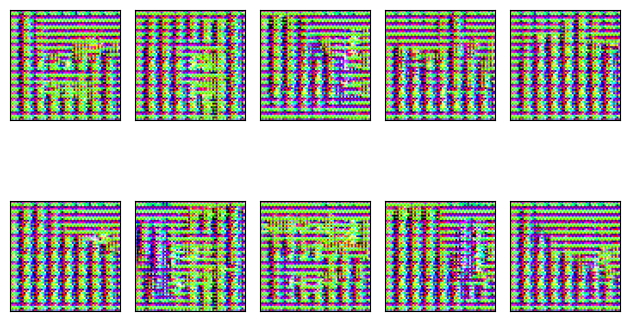

Epoch: 81,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 82
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 82,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 83
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 83,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 84
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 84,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 85
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 85,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 86
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 18ms/step


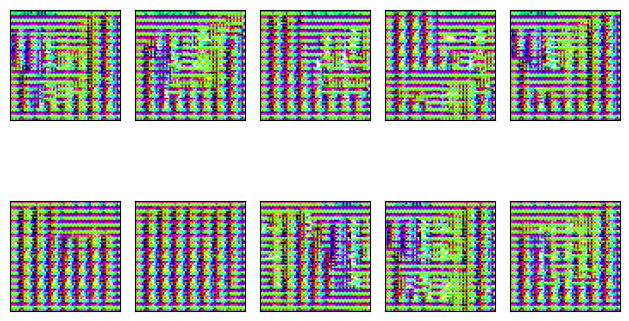

Epoch: 86,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 87
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 87,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 88
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 88,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 89
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 89,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 90
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 90,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 91
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 20ms/step


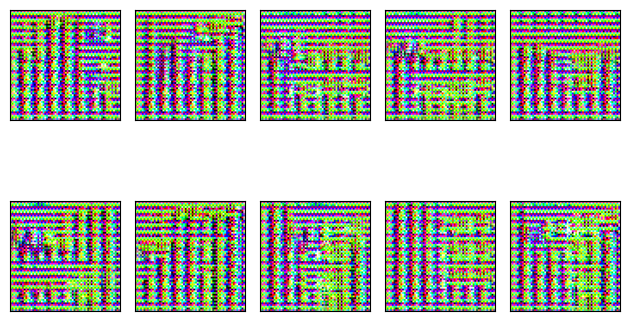

Epoch: 91,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 92
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 92,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 93
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 93,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 94
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 94,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 95
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 95,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 96
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 19ms/step


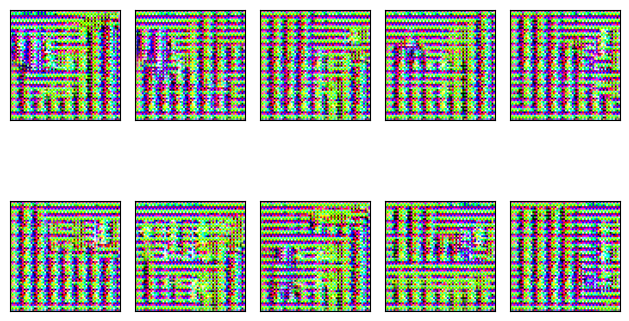

Epoch: 96,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 97
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 97,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 98
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 98,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 99
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 99,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 100
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 100,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 101
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 17ms/step


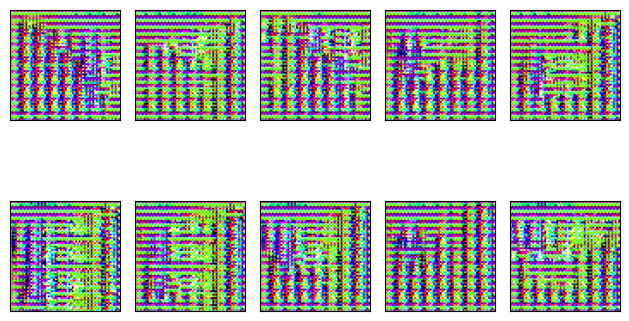

Epoch: 101,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 102
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 102,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 103
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 103,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 104
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 104,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 105
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 105,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 106
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 26ms/step


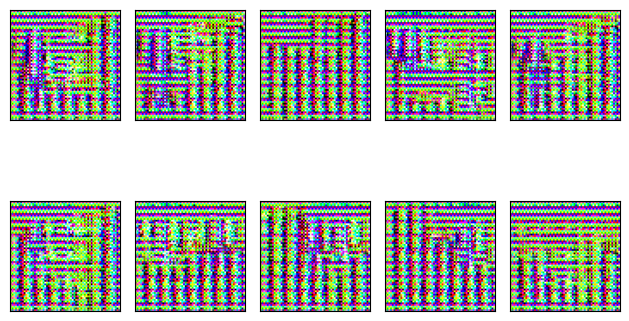

Epoch: 106,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 107
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 107,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 108
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 108,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 109
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 109,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 110
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 110,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 111
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 19ms/step


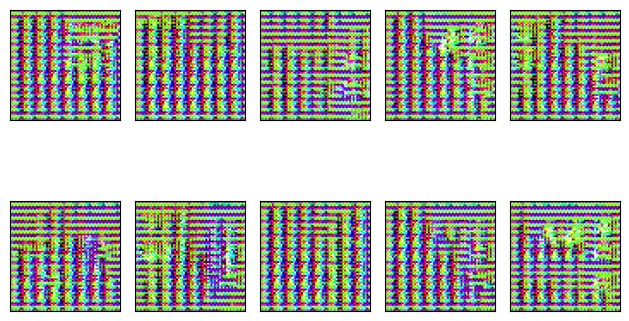

Epoch: 111,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 112
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 112,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 113
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 113,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 114
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 114,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 115
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 115,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 116
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 20ms/step


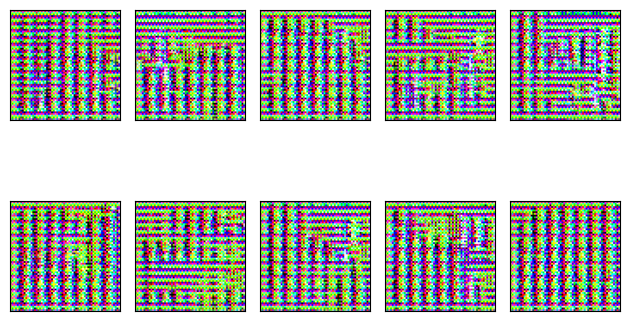

Epoch: 116,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 117
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 117,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 118
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 118,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 119
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 119,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 120
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 120,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 121
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 20ms/step


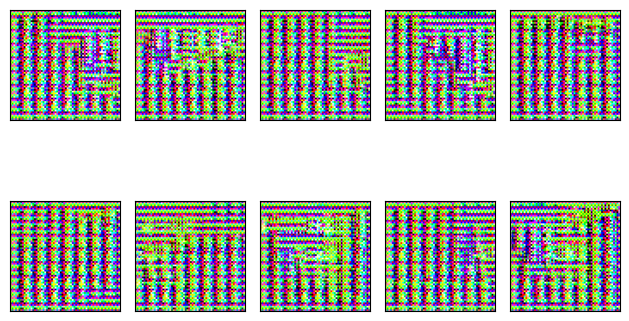

Epoch: 121,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 122
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 122,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 123
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 123,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 124
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 124,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 125
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 125,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 126
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 24ms/step


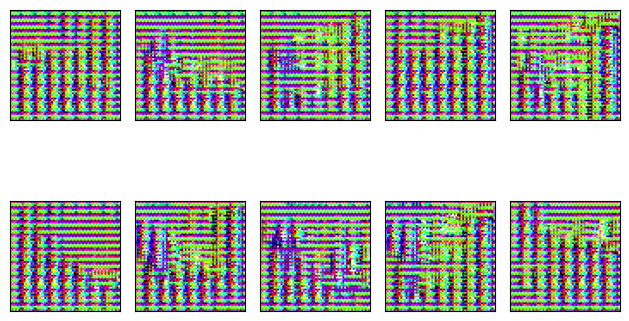

Epoch: 126,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 127
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 127,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 128
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 128,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 129
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 129,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 130
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 130,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 131
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 19ms/step


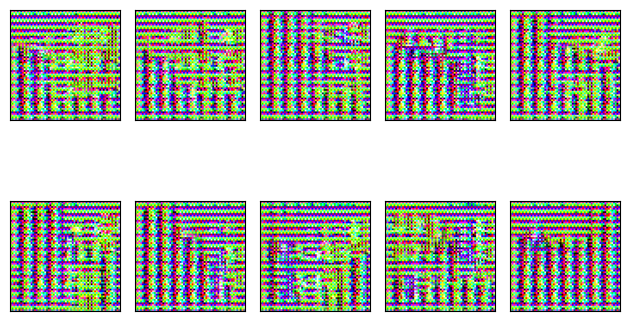

Epoch: 131,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 132
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 132,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 133
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 133,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 134
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 134,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 135
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 135,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 136
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 21ms/step


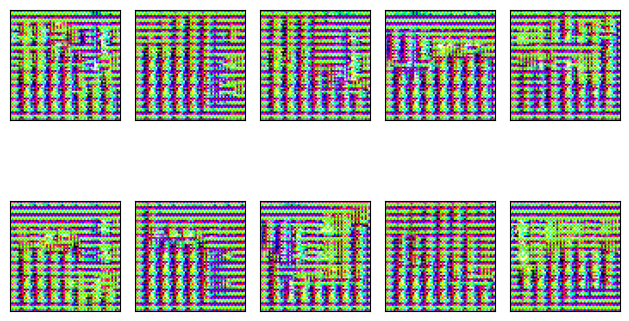

Epoch: 136,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 137
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 137,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 138
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 138,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 139
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 139,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 140
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 140,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 141
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 22ms/step


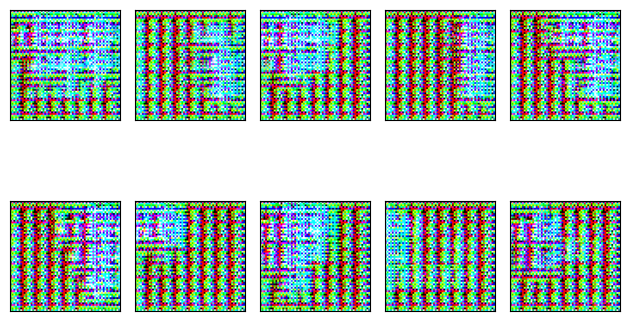

Epoch: 141,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 142
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 142,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 143
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 143,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 144
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 144,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 145
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 145,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 146
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 20ms/step


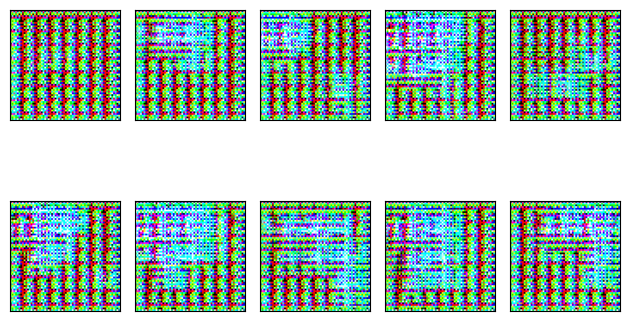

Epoch: 146,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 147
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 147,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 148
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 148,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 149
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 149,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 150
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 150,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 151
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 17ms/step


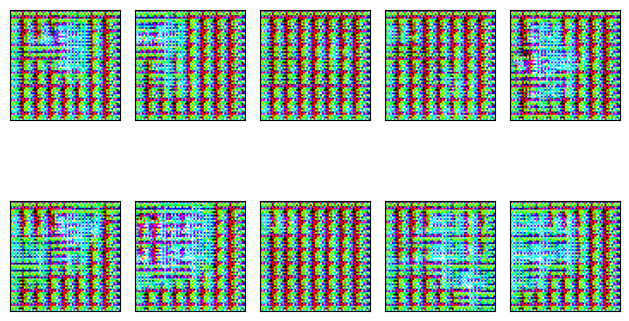

Epoch: 151,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 152
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 152,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 153
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 153,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 154
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 154,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 155
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 155,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 156
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
1/1 [==============================] - 0s 18ms/step


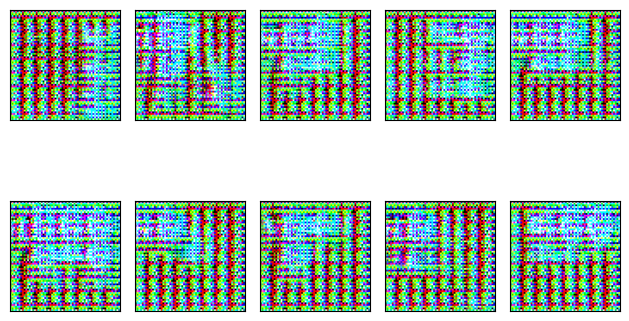

Epoch: 156,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 157
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 157,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 158
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 158,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 159
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 159,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 160
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 160,  Loss: D_real = 0.0000, D_fake = 0.0000,  G = 0.0000
Currently on Epoch 161
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


In [ ]:
#######################Training#################
epochs = 300
batch_size = 128
D_loss=[]
G_loss=[]
with tf.device('/gpu:0'):
 for epoch in range(epochs):
    print(f"Currently on Epoch {epoch+1}")

    # For every batch in the dataset
    for i in range((train_data).shape[0]//batch_size):

        if (i)%100 == 0:
            print(f"\tCurrently on batch number {i} of {len(train_data)//batch_size}")

        noise=np.random.uniform(-1,1,size=[batch_size,noise_shape])

        gen_image = generator.predict_on_batch(noise)

        train_dataset = train_data[i*batch_size:(i+1)*batch_size]
        #train on real image
        train_label=np.ones(shape=(batch_size,1))
        discriminator.trainable = True
        d_loss1 = discriminator.train_on_batch(train_dataset,train_label)

        #train on fake image
        train_label=np.zeros(shape=(batch_size,1))
        d_loss2 = discriminator.train_on_batch(gen_image,train_label)


        noise=np.random.uniform(-1,1,size=[batch_size,noise_shape])
        train_label=np.ones(shape=(batch_size,1))
        discriminator.trainable = False
        #train the generator
        g_loss = GAN.train_on_batch(noise, train_label)
        D_loss.append(d_loss1+d_loss2)
        G_loss.append(g_loss)


    if epoch % 5 == 0:
        samples = 10
        x_fake = generator.predict(np.random.normal(loc=0, scale=1, size=(samples,100)))

        for k in range(samples):
            plt.subplot(2, 5, k+1)
            plt.imshow(x_fake[k].reshape(64,64,3))
            plt.xticks([])
            plt.yticks([])


        plt.tight_layout()
        plt.show()
    print('Epoch: %d,  Loss: D_real = %.4f, D_fake = %.4f,  G = %.4f' %   (epoch+1, d_loss1, d_loss2, g_loss))
print('Training is complete')

In [ ]:
DATA_PATH="/content/drive/MyDrive/test/"
#save the model after training
GAN.save(os.path.join(DATA_PATH,"face_gen.h5"))